<a href="https://colab.research.google.com/github/mdssumin/SmartFactory_with_MDSTech_2nd/blob/main/Personal_Project/Younggyu_Kim/wheelchair.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**기본 세팅**

In [ ]:
import pandas as pd
import os
import natsort
from glob import glob
import yaml
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#**훈련용 데이터셋 불러오기**

In [ ]:
%cd /content/
#!curl -L "https://universe.roboflow.com/ds/QlTLB7gFpn?key=rP5qBTryP2" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
!curl -L "https://universe.roboflow.com/ds/ShTG1Wzmul?key=GJhngsRdBQ" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   894  100   894    0     0   1765      0 --:--:-- --:--:-- --:--:--  1763
100 15.7M  100 15.7M    0     0  17.5M      0 --:--:-- --:--:-- --:--:-- 17.5M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/----------------------162568023_jpg.rf.e92b585ffe0fee57d9c7848ed2e99fbe.jpg  
 extracting: test/images/--------31422726_jpg.rf.ba0da04fe2e5215d424b62b54b007657.jpg  
 extracting: test/images/---100_jpg.rf.9fe0e7580b64f7755224c7527574f264.jpg  
 extracting: test/images/---107_jpg.rf.ee5717f349ef385e5daa1512bc8a7a6a.jpg  
 extracting: test/images/---113_jpg.rf.a3a33f5e843d7a7024e7b7512b9cc5fa.jpg  
 extracting: test/images/---122_jpg.rf.090c89ae32ab6161dc2694efb0bdd

In [ ]:
%cat /content/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 2
names: ['people', 'peopleWithWheelchair']

roboflow:
  workspace: 2458761304-qq-com
  project: wheelchair-detection
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/2458761304-qq-com/wheelchair-detection/dataset/1

In [ ]:
%cd /content

train_img_list = glob('/content/train/images/*.jpg')
val_img_list = glob('/content/test/images/*.jpg')

print(len(train_img_list))
print(len(val_img_list))

/content
463
51


In [ ]:
with open('/content/train.txt', 'w') as t:
  t.write('\n'.join(train_img_list) + '\n')

with open('/content/val.txt', 'w') as v:
  v.write('\n'.join(val_img_list) + '\n')

In [ ]:
with open('/content/data.yaml', 'r') as f:
  data = yaml.full_load(f)
print(data)

data['train'] = '/content/train.txt'
data['val'] = '/content/val.txt'

with  open('/content/data.yaml', 'w') as f:
  yaml.dump(data, f)
print(data)

{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 2, 'names': ['people', 'peopleWithWheelchair'], 'roboflow': {'workspace': '2458761304-qq-com', 'project': 'wheelchair-detection', 'version': 1, 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/2458761304-qq-com/wheelchair-detection/dataset/1'}}
{'train': '/content/train.txt', 'val': '/content/val.txt', 'test': '../test/images', 'nc': 2, 'names': ['people', 'peopleWithWheelchair'], 'roboflow': {'workspace': '2458761304-qq-com', 'project': 'wheelchair-detection', 'version': 1, 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/2458761304-qq-com/wheelchair-detection/dataset/1'}}


In [ ]:
%cat /content/data.yaml

names:
- people
- peopleWithWheelchair
nc: 2
roboflow:
  license: CC BY 4.0
  project: wheelchair-detection
  url: https://universe.roboflow.com/2458761304-qq-com/wheelchair-detection/dataset/1
  version: 1
  workspace: 2458761304-qq-com
test: ../test/images
train: /content/train.txt
val: /content/val.txt


#**Yolov8 불러오고 학습(epochs 20)**

In [ ]:
!pip install ultralytics
from ultralytics import YOLO

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 608.0/608.0 kB 6.4 MB/s eta 0:00:00


In [ ]:
model = YOLO('yolov8n.yaml').load('yolov8n.pt')
model.train(data='/content/data.yaml', epochs=20)


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

#**이미지에 대해 테스트(Yolov8로 객체 탐지 후, bounding box에 대해 pose estimate)**

##1) 성공 케이스

####1. Yolov8로 객체 탐지


0: 448x640 2 peopleWithWheelchairs, 10.4ms
Speed: 2.8ms preprocess, 10.4ms inference, 2.6ms postprocess per image at shape (1, 3, 448, 640)


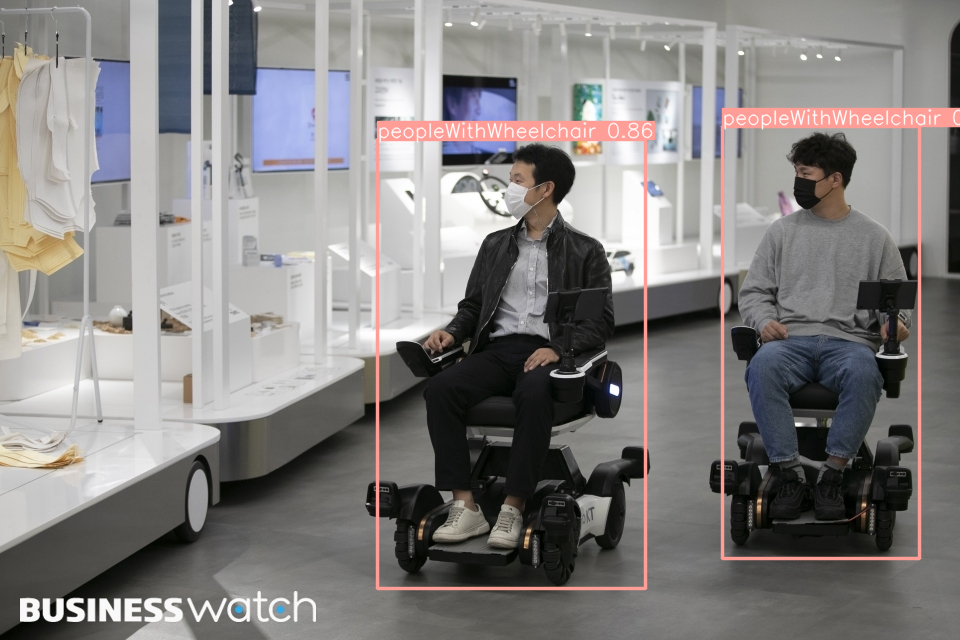

In [ ]:
image = cv2.imread('/content/drive/MyDrive/drivedataset/wheelchair/wheelchair_ex5.jpg')
result = model(image)
cv2_imshow(result[0].plot())

In [ ]:
result[0].boxes

WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.


ultralytics.engine.results.Boxes object with attributes:

boxes: tensor([[3.7774e+02, 1.3984e+02, 6.4521e+02, 5.8853e+02, 8.5633e-01, 1.0000e+00],
        [7.2214e+02, 1.2698e+02, 9.1920e+02, 5.5842e+02, 8.4112e-01, 1.0000e+00]], device='cuda:0')
cls: tensor([1., 1.], device='cuda:0')
conf: tensor([0.8563, 0.8411], device='cuda:0')
data: tensor([[3.7774e+02, 1.3984e+02, 6.4521e+02, 5.8853e+02, 8.5633e-01, 1.0000e+00],
        [7.2214e+02, 1.2698e+02, 9.1920e+02, 5.5842e+02, 8.4112e-01, 1.0000e+00]], device='cuda:0')
id: None
is_track: False
orig_shape: (640, 960)
shape: torch.Size([2, 6])
xywh: tensor([[511.4731, 364.1827, 267.4681, 448.6926],
        [820.6713, 342.6984, 197.0612, 431.4388]], device='cuda:0')
xywhn: tensor([[0.5328, 0.5690, 0.2786, 0.7011],
        [0.8549, 0.5355, 0.2053, 0.6741]], device='cuda:0')
xyxy: tensor([[377.7390, 139.8365, 645.2072, 588.5291],
        [722.1407, 126.9790, 919.2019, 558.4177]], device='cuda:0')
xyxyn: tensor([[0.3935, 0.2185, 0.6721, 0.9196]

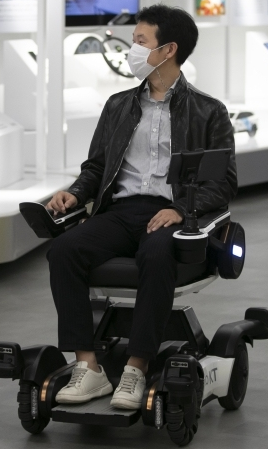

In [ ]:
x = int(result[0].boxes.xyxy.tolist()[0][0])
y = int(result[0].boxes.xyxy.tolist()[0][1])
w = int(result[0].boxes.xyxy.tolist()[0][2])
h = int(result[0].boxes.xyxy.tolist()[0][3])

cropped_image = image[y: h, x: w]
cv2_imshow(cropped_image)

####2. MPII 모델을 사용한 pose estimate

In [ ]:
network = cv2.dnn.readNetFromCaffe('/content/drive/MyDrive/vision_handout/computer_vision_masterclass/Weights/pose_deploy_linevec_faster_4_stages.prototxt',
                                   '/content/drive/MyDrive/vision_handout/computer_vision_masterclass/Weights/pose_iter_160000.caffemodel')

In [ ]:
#cropped_image.shape

image = cropped_image
height = image.shape[0]
width = image.shape[1]

image_blob = cv2.dnn.blobFromImage(image=image, scalefactor=1/255, size=(width, height))
#type(image_blob), image_blob.shape

network.setInput(image_blob)
output = network.forward()
#output.shape

feature_map_height = output.shape[2]
feature_map_width = output.shape[3]

num_body_points = 15  # number of body points except for background in MPII model
body_points = []
confidence_threshold = 0.1

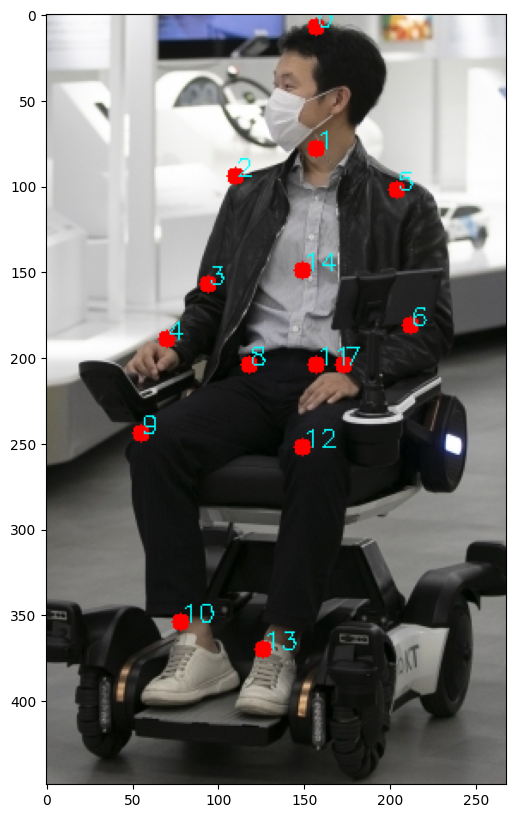

In [ ]:
for body_point_idx in range(num_body_points):
    confidence_map = output[0, body_point_idx, :, :]
    _, max_confidence, _, max_position = cv2.minMaxLoc(confidence_map)

    # scaling x, y position
    x = int((image.shape[1] * max_position[0]) / feature_map_width)
    y = int((image.shape[0] * max_position[1]) / feature_map_height)

    if max_confidence > confidence_threshold:
        cv2.circle(image, (x, y), 5, (0, 0, 255), thickness=-1)
        cv2.putText(image, f'{body_point_idx}', (x, y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 0))
        body_points.append((x, y))
    else:
        body_points.append(None)

plt.figure(figsize=(14,10))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB));

In [ ]:
body_points

[(157, 7),
 (157, 78),
 (110, 94),
 (94, 157),
 (70, 189),
 (204, 102),
 (212, 181),
 (173, 204),
 (118, 204),
 (55, 244),
 (78, 354),
 (157, 204),
 (149, 252),
 (126, 370),
 (149, 149)]

In [ ]:
def verify_arms_up(points):
  head, right_wrist, left_wrist = 0, 0, 0

  for i, point in enumerate(points):
    if i == 1: #neck
      head = point[1]
    elif i == 4:
      right_wrist = point[1]
    elif i == 7:
      left_wrist = point[1]

  if  right_wrist < head and left_wrist < head:
    return True
  else:
    return False

In [ ]:
verify_arms_up(body_points)

False

##2) 애매한 케이스

####0. pose estimate 부분을 함수화

In [ ]:
# def verify_arms_up(points):
#   head, right_wrist, left_wrist = 0, 0, 0

#   for i, point in enumerate(points):
#     try:
#       if i == 1: #neck
#         head = point[1]
#     except TypeError:
#       continue

#     try:
#       if i == 4:
#         right_wrist = point[1]
#     except TypeError:
#       continue

#     try:
#       if i == 7:
#         left_wrist = point[1]
#     except TypeError:
#       continue

#   if  right_wrist < head or left_wrist < head:
#     return True
#   else:
#     return False

In [ ]:
network = cv2.dnn.readNetFromCaffe('/content/drive/MyDrive/vision_handout/computer_vision_masterclass/Weights/pose_deploy_linevec_faster_4_stages.prototxt',
                                   '/content/drive/MyDrive/vision_handout/computer_vision_masterclass/Weights/pose_iter_160000.caffemodel')

In [ ]:
def verify_arms_up(points):
  head, right_wrist, left_wrist = 0, 0, 0

  for i, point in enumerate(points):
    if i == 1: #neck
      head = point[1]
    elif i == 4:
      right_wrist = point[1]
    elif i == 7:
      left_wrist = point[1]

  if  right_wrist < head and left_wrist < head:
    return True
  else:
    return False

In [ ]:
def pose_estimate(image):
  height = image.shape[0]
  width = image.shape[1]

  image_blob = cv2.dnn.blobFromImage(image=image, scalefactor=1/255, size=(width, height))

  network.setInput(image_blob)
  output = network.forward()

  feature_map_height = output.shape[2]
  feature_map_width = output.shape[3]

  num_body_points = 15  # number of body points except for background in MPII model
  body_points = []
  confidence_threshold = 0.1

  for body_point_idx in range(num_body_points):
      confidence_map = output[0, body_point_idx, :, :]
      _, max_confidence, _, max_position = cv2.minMaxLoc(confidence_map)

      # scaling x, y position
      x = int((image.shape[1] * max_position[0]) / feature_map_width)
      y = int((image.shape[0] * max_position[1]) / feature_map_height)

      if max_confidence > confidence_threshold:
          body_points.append((x, y))
      else:
          body_points.append((0, 0))

  if verify_arms_up(body_points):
    print('T')
  else:
    print('F')

In [ ]:
def pose_estimate_plot(image):
  height = image.shape[0]
  width = image.shape[1]

  image_blob = cv2.dnn.blobFromImage(image=image, scalefactor=1/255, size=(width, height))

  network.setInput(image_blob)
  output = network.forward()

  feature_map_height = output.shape[2]
  feature_map_width = output.shape[3]

  num_body_points = 15  # number of body points except for background in MPII model
  body_points = []
  confidence_threshold = 0.1

  for body_point_idx in range(num_body_points):
      confidence_map = output[0, body_point_idx, :, :]
      _, max_confidence, _, max_position = cv2.minMaxLoc(confidence_map)

      # scaling x, y position
      x = int((image.shape[1] * max_position[0]) / feature_map_width)
      y = int((image.shape[0] * max_position[1]) / feature_map_height)

      if max_confidence > confidence_threshold:
          cv2.circle(image, (x, y), 5, (0, 0, 255), thickness=-1)
          cv2.putText(image, f'{body_point_idx}', (x, y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 0))
          body_points.append((x, y))
      else:
          body_points.append((0, 0))

  plt.figure(figsize=(14,10))
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB));

####1. Yolov8로 객체 탐지


0: 544x640 2 peopleWithWheelchairs, 8.2ms
Speed: 3.2ms preprocess, 8.2ms inference, 2.0ms postprocess per image at shape (1, 3, 544, 640)


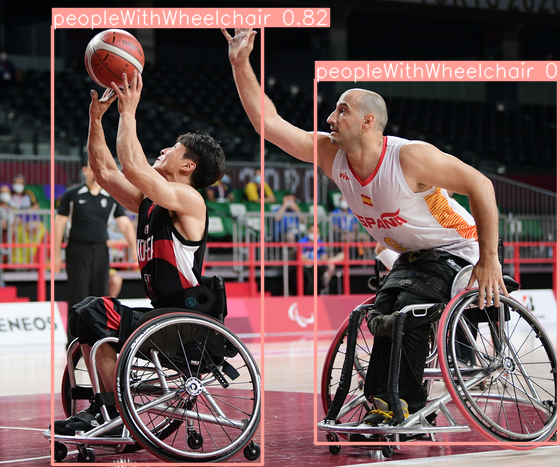

In [112]:
image = cv2.imread('/content/drive/MyDrive/drivedataset/wheelchair/wheelchair_ex7.jpg')
result = model(image)
cv2_imshow(result[0].plot())

####2. MPII 모델을 사용한 pose estimate

In [113]:
#좌측 박스는 bouding box 안에 신체 전체가 들어가서 pose estimation이 성공적으로 이루어짐
#우측 박스는 손이 bounding box 밖으로 벗어나 pose estimation이 성공적으로 이루어지지 않음
for i in range(0, len(result[0].boxes.xywh.tolist())):
  x = int(result[0].boxes.xyxy.tolist()[i][0])
  y = int(result[0].boxes.xyxy.tolist()[i][1])
  w = int(result[0].boxes.xyxy.tolist()[i][2])
  h = int(result[0].boxes.xyxy.tolist()[i][3])

  cropped_img = image[y: h, x: w]
  pose_estimate(cropped_img)

T
F


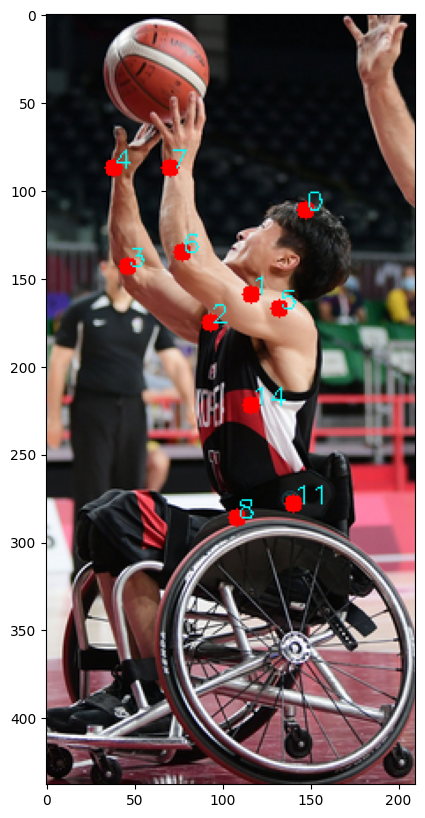

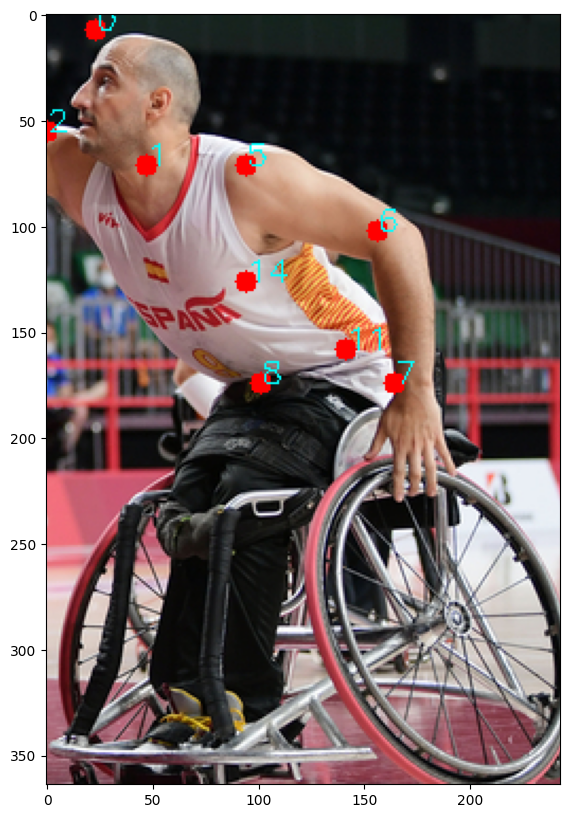

In [114]:
for i in range(0, len(result[0].boxes.xywh.tolist())):
  x = int(result[0].boxes.xyxy.tolist()[i][0])
  y = int(result[0].boxes.xyxy.tolist()[i][1])
  w = int(result[0].boxes.xyxy.tolist()[i][2])
  h = int(result[0].boxes.xyxy.tolist()[i][3])

  cropped_img = image[y: h, x: w]
  pose_estimate_plot(cropped_img)

##3) 실패 케이스

####1. Yolov8로 객체 탐지


0: 640x384 1 peopleWithWheelchair, 6.9ms
Speed: 3.3ms preprocess, 6.9ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 384)


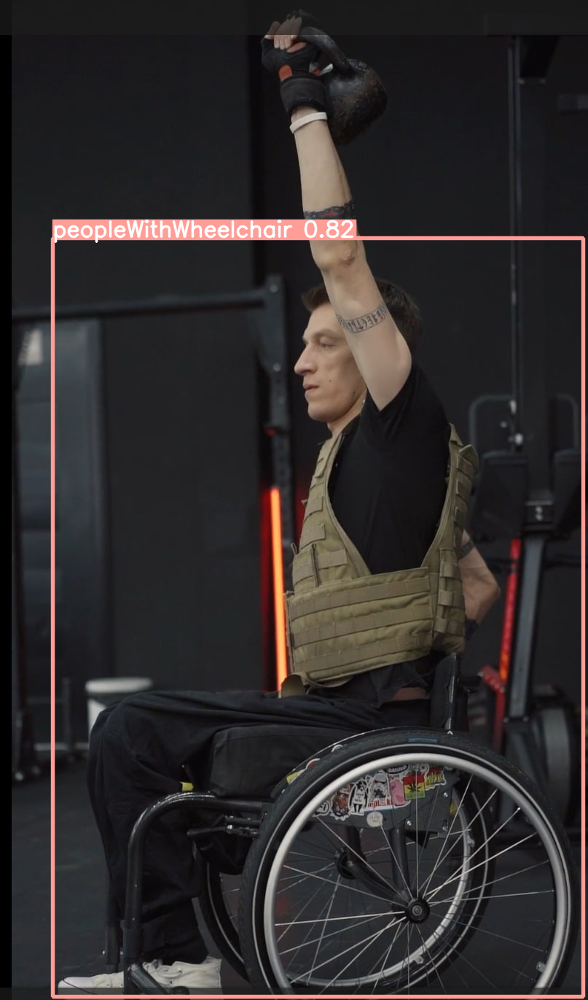

In [ ]:
image = cv2.imread('/content/drive/MyDrive/drivedataset/wheelchair/wheelchair_ex8.jpg')
result = model(image)
cv2_imshow(result[0].plot())

####2. MPII 모델을 사용한 pose estimate

In [ ]:
for i in range(0, len(result[0].boxes.xywh.tolist())):
  x = int(result[0].boxes.xyxy.tolist()[i][0])
  y = int(result[0].boxes.xyxy.tolist()[i][1])
  w = int(result[0].boxes.xyxy.tolist()[i][2])
  h = int(result[0].boxes.xyxy.tolist()[i][3])

  cropped_img = image[y: h, x: w]
  pose_estimate(cropped_img)

F


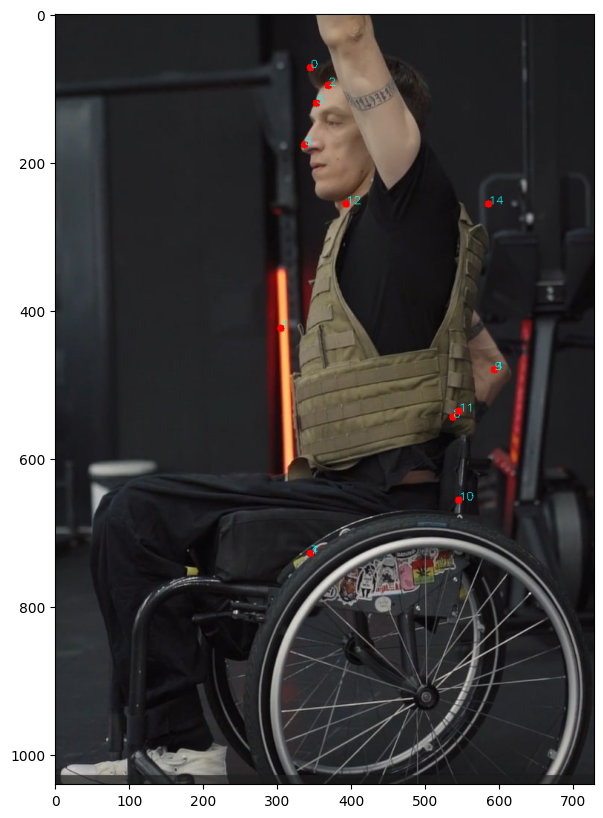

In [ ]:
#측면 모습에서 pose estimation이 잘 되지 않는 모습
pose_estimate_plot(cropped_img)

#**비디오에 대해 테스트**

T
T
F


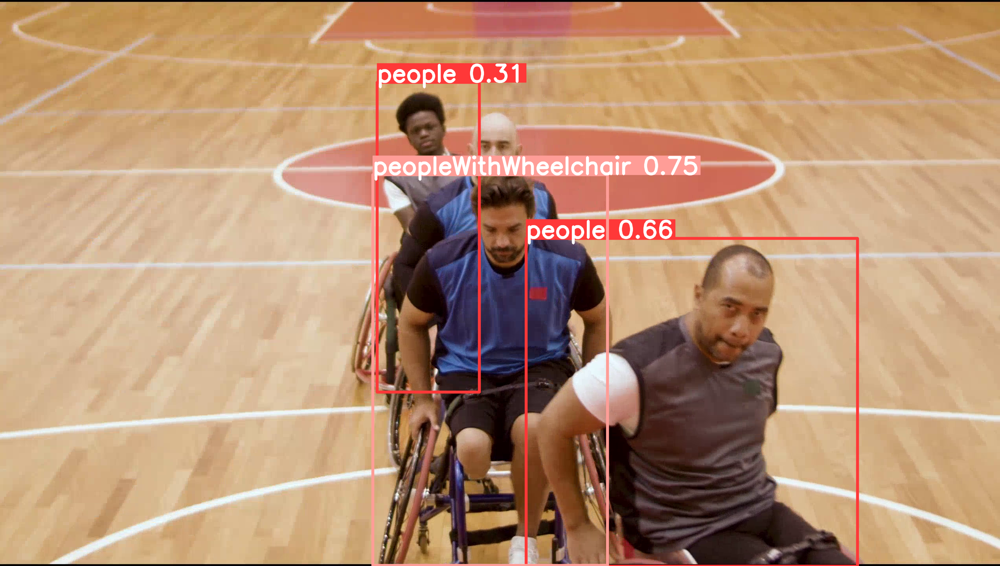


0: 384x640 2 peoples, 1 peopleWithWheelchair, 9.6ms
Speed: 2.8ms preprocess, 9.6ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


T
T
F


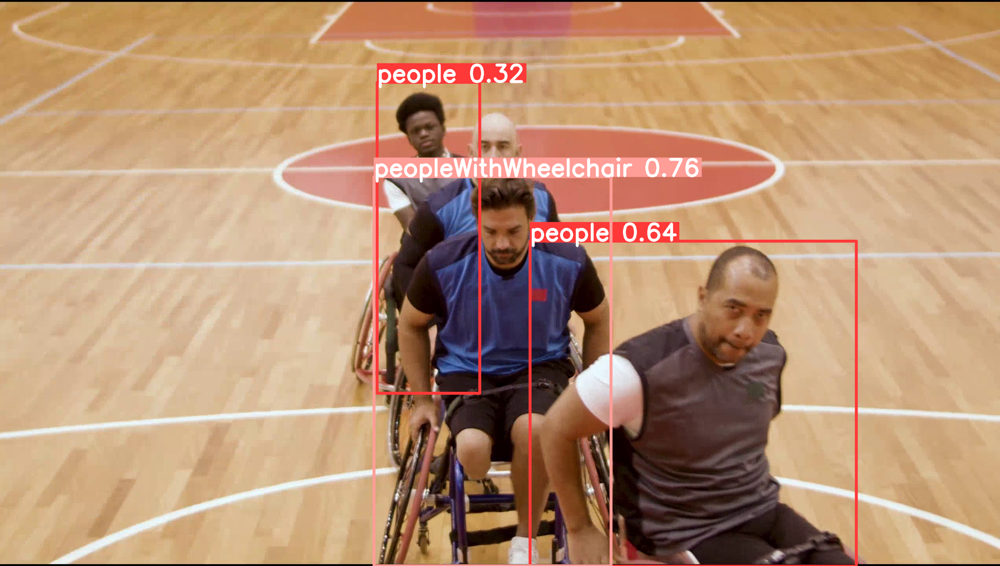


0: 384x640 2 peoples, 1 peopleWithWheelchair, 8.1ms
Speed: 3.6ms preprocess, 8.1ms inference, 4.1ms postprocess per image at shape (1, 3, 384, 640)


F
T
F


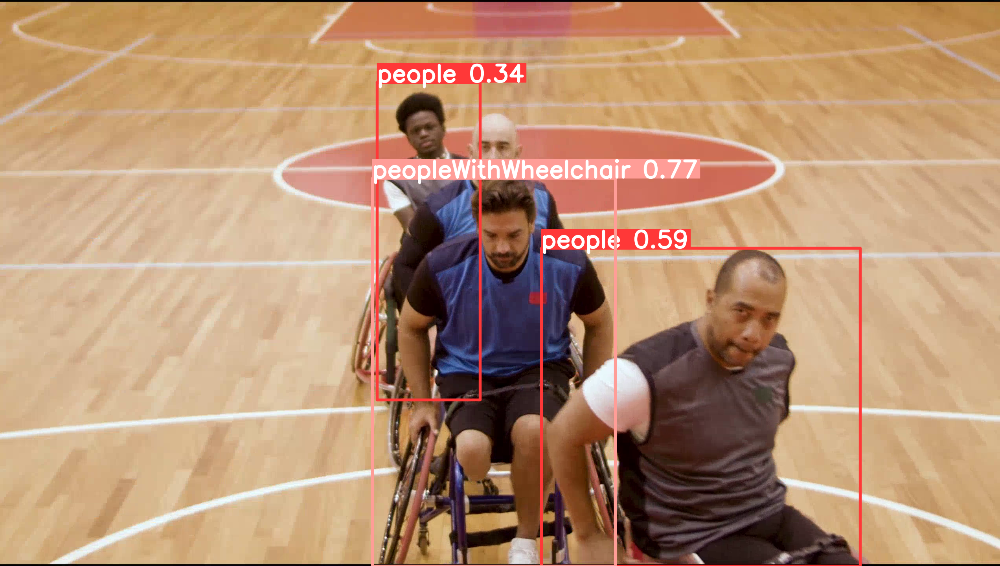


0: 384x640 3 peoples, 1 peopleWithWheelchair, 10.0ms
Speed: 2.5ms preprocess, 10.0ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 640)


KeyboardInterrupt: ignored

In [115]:
video_path = '/content/drive/MyDrive/drivedataset/wheelchair/wheelchair3.mp4'
cap = cv2.VideoCapture(video_path)

while cap.isOpened():
  success, frame = cap.read()

  if success:
    result = model(frame)
    for i in range(0, len(result[0].boxes.xywh.tolist())):
      x = int(result[0].boxes.xyxy.tolist()[i][0])
      y = int(result[0].boxes.xyxy.tolist()[i][1])
      w = int(result[0].boxes.xyxy.tolist()[i][2])
      h = int(result[0].boxes.xyxy.tolist()[i][3])

      cropped_img = frame[y: h, x: w]
      pose_estimate(cropped_img)

    annotated_frame = result[0].plot()
    cv2_imshow(annotated_frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
      break
  else:
    break

cap.release()